# COURSERA CAPSTONE FINAL - Part 2

In the following maps, the cluster technique is applied to show which city areas has most restaurants

In [27]:
restaurants = plugins.MarkerCluster().add_to(rio_map)
for lat, lng, rests in zip(rio_restaurants['Venue Latitude'], rio_restaurants['Venue Longitude'],rio_restaurants['Venue'].apply(unidecode)):
    label = '{}'.format(rests)
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        location=[lat,lng],
        popup=label,
        icon=folium.Icon(color='green', icon='ok-sign'),
    ).add_to(restaurants)
    
rio_map

In [28]:
restaurants = plugins.MarkerCluster().add_to(recife_map)

for lat, lng, rests, in zip(recife_restaurants['Venue Latitude'], recife_restaurants['Venue Longitude'], 
                            recife_restaurants['Venue'].apply(unidecode)):
    label = '{}'.format(rests)
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        location=[lat,lng],
        popup=label,
        icon=folium.Icon(color='green', icon='ok-sign'),
    ).add_to(restaurants)


    
recife_map

Now let´s count how many restaurant categories exists in each city 

In [29]:
recife_restaurants_categories = recife_restaurants.groupby('Venue Category').count().sort_values(
    by='Neighborhoods',ascending=False)
recife_restaurants_categories.rename(columns = {'Neighborhoods':'Qty'}, inplace = True)
recife_restaurants_categories.drop(recife_restaurants_categories.columns[[1,2,3,4,5]], axis=1, inplace=True)
recife_restaurants_categories = recife_restaurants_categories.reset_index()
recife_restaurants_categories["%"] = (recife_restaurants_categories['Qty'] / 
                                      recife_restaurants_categories['Qty'].sum())
recife_restaurants_categories


,Venue Category,Qty,%
0,Brazilian Restaurant,118,0.293532
1,Restaurant,78,0.194030
2,Japanese Restaurant,35,0.087065
3,Chinese Restaurant,30,0.074627
4,Fast Food Restaurant,29,0.072139
5,Italian Restaurant,25,0.062189
6,Sushi Restaurant,23,0.057214
7,Seafood Restaurant,12,0.029851
8,Vegetarian / Vegan Restaurant,11,0.027363
9,Northeastern Brazilian Restaurant,8,0.019900


In [30]:
rio_restaurants_categories = rio_restaurants.groupby('Venue Category').count().sort_values(
    by='Neighborhoods',ascending=False)
rio_restaurants_categories.rename(columns = {'Neighborhoods':'Qty'}, inplace = True)
rio_restaurants_categories.drop(rio_restaurants_categories.columns[[1,2,3,4,5]], axis=1, inplace=True)
rio_restaurants_categories = rio_restaurants_categories.reset_index()
rio_restaurants_categories["%"] = rio_restaurants_categories['Qty'] / rio_restaurants_categories['Qty'].sum()
rio_restaurants_categories

,Venue Category,Qty,%
0,Brazilian Restaurant,186,0.343173
1,Restaurant,93,0.171587
2,Fast Food Restaurant,50,0.092251
3,Japanese Restaurant,46,0.084871
4,Italian Restaurant,32,0.059041
5,Seafood Restaurant,19,0.035055
6,Middle Eastern Restaurant,14,0.025830
7,Vegetarian / Vegan Restaurant,13,0.023985
8,Portuguese Restaurant,13,0.023985
9,Sushi Restaurant,10,0.018450


In the following barplots, is shown the frequency of each type of restaurant.

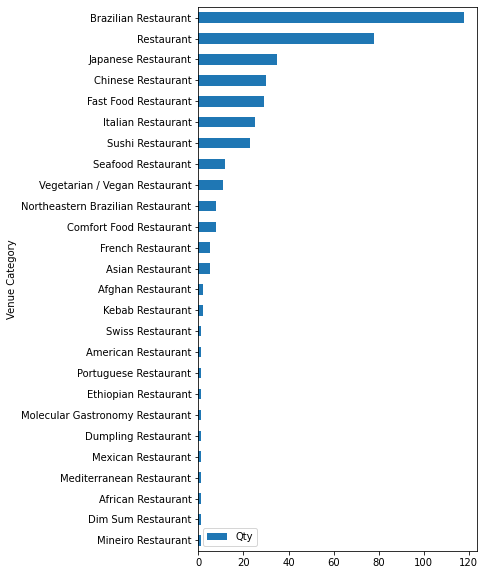

In [31]:
recife_plot = recife_restaurants_categories.plot(x='Venue Category', y='Qty',kind='barh', figsize=(5,10))
recife_plot.invert_yaxis()

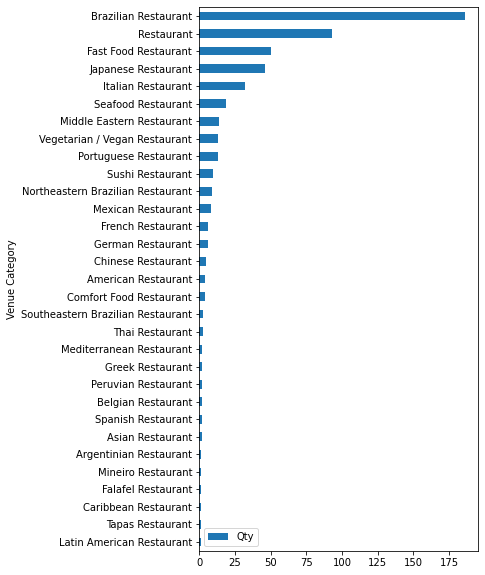

In [32]:
rio_plot = rio_restaurants_categories.plot(x='Venue Category', y='Qty',kind='barh', figsize=(5,10))
rio_plot.invert_yaxis()

In order to compare the frequencies, we have to gather two data in a single dataframe.

In [33]:
qty_categories_in_both_cities = pd.merge(rio_restaurants_categories, 
                                         recife_restaurants_categories, how='outer', on=['Venue Category'])
qty_categories_in_both_cities.rename(columns = {'%_x':'% in Rio', '%_y':'% in Recife'}, inplace = True)
qty_categories_in_both_cities

,Venue Category,Qty_x,% in Rio,Qty_y,% in Recife
0,Brazilian Restaurant,186.0,0.343173,118.0,0.293532
1,Restaurant,93.0,0.171587,78.0,0.194030
2,Fast Food Restaurant,50.0,0.092251,29.0,0.072139
3,Japanese Restaurant,46.0,0.084871,35.0,0.087065
4,Italian Restaurant,32.0,0.059041,25.0,0.062189
5,Seafood Restaurant,19.0,0.035055,12.0,0.029851
6,Middle Eastern Restaurant,14.0,0.025830,NaN,NaN
7,Vegetarian / Vegan Restaurant,13.0,0.023985,11.0,0.027363
8,Portuguese Restaurant,13.0,0.023985,1.0,0.002488
9,Sushi Restaurant,10.0,0.018450,23.0,0.057214


And show a barplot about both cities together.

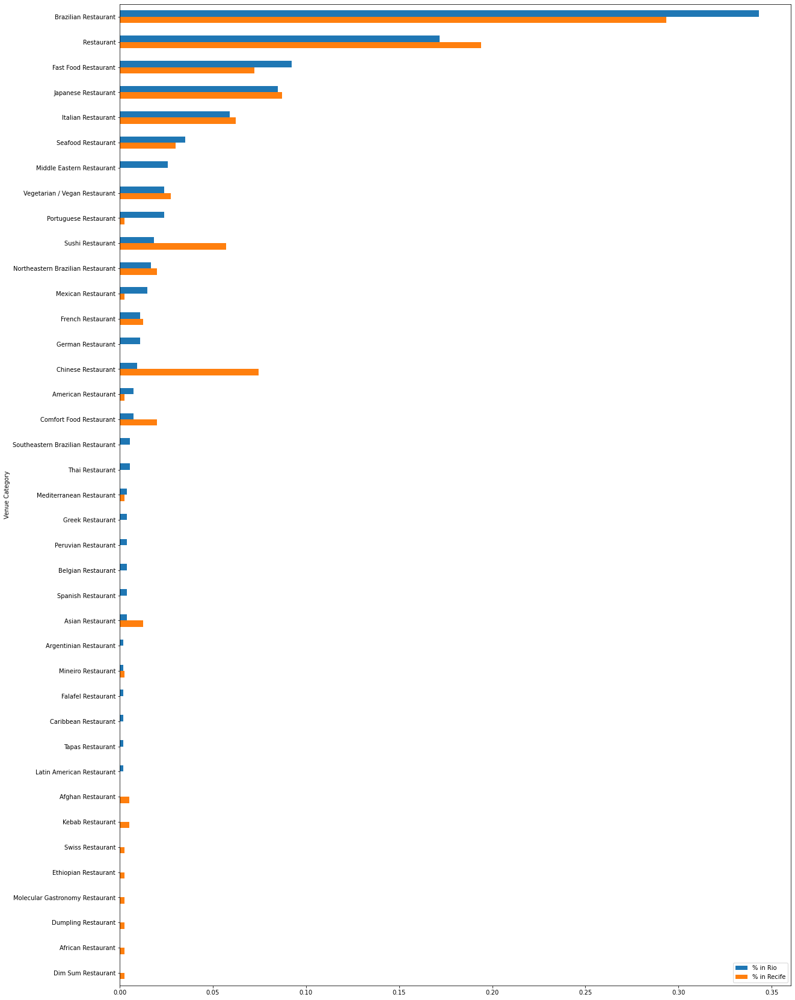

In [34]:
qty_categories_in_both_cities.drop(qty_categories_in_both_cities.columns[[1,3]], axis=1, inplace=True)
qty_categories_in_both_cities_plot = qty_categories_in_both_cities.plot.barh(x='Venue Category',figsize=(20,30))
qty_categories_in_both_cities_plot.invert_yaxis()

To help the visualization, let´s make a scatterplot.

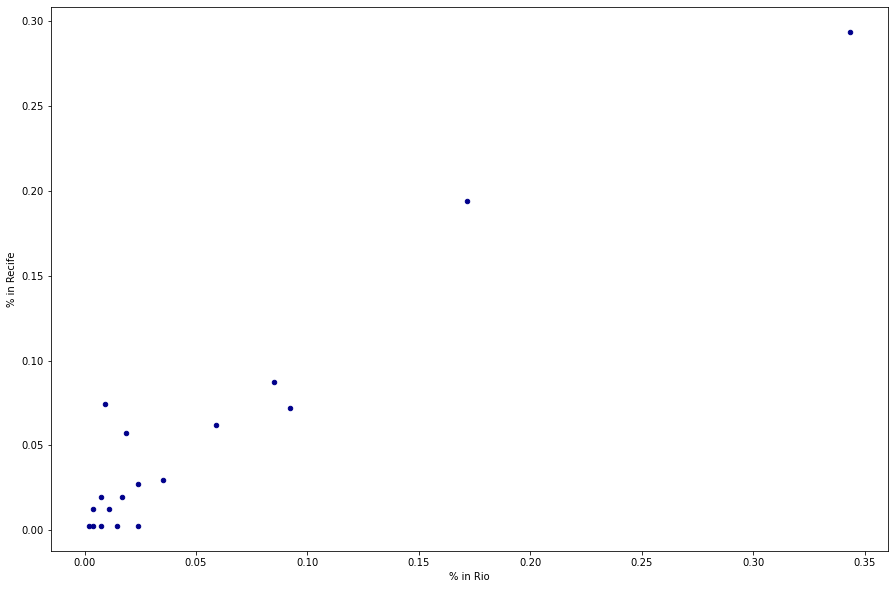

In [35]:
ax1 = qty_categories_in_both_cities.plot.scatter(x='% in Rio', y='% in Recife',c='DarkBlue', figsize=(15,10))

Now we´ll verify if there is a correlation between the restaurant categories of each city.

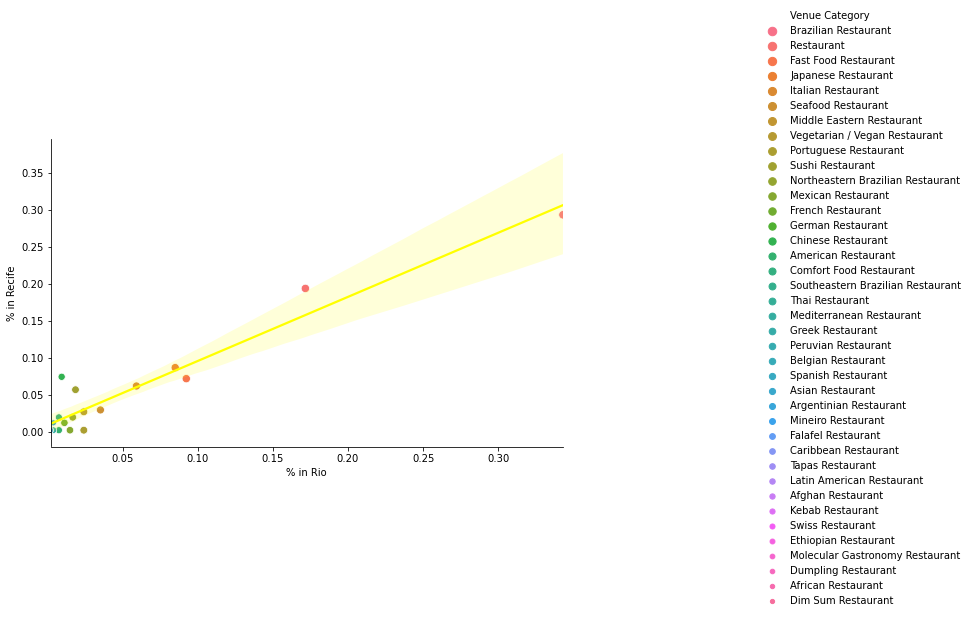

In [36]:
ax2 = sns.relplot(data=qty_categories_in_both_cities,x='% in Rio', y='% in Recife', 
                  hue="Venue Category", size = "Venue Category")
ax2 = sns.regplot(y='% in Recife', x='% in Rio', data= qty_categories_in_both_cities, 
                  color='k', scatter_kws={"alpha" : 0.0}, line_kws={"color": "yellow"})
ax2.figure.set_size_inches(15,5)

Clearly, there is a strong correlation. Let´s verify the correlation results.

In [37]:
corr = qty_categories_in_both_cities.corr(method ='pearson')
corr.style.background_gradient(cmap='coolwarm')

,% in Rio,% in Recife
% in Rio,1.000000,0.960114
% in Recife,0.960114,1.000000


# 4. Results

The results obtained are:

a) Recife has 94 neighborhoods, 2286 venues and 248 unique categories. Related to restaurants, were found a total of 402 of 26 categories of different types in the city.

b) Rio de Janeiro has 163 neighborhoods, 3124 venues and 294 unique categories. Related to restaurants, were found a total of 542 of 31 different types in the city.

c) The correlation between the restaurant categories of the two cities is very strong (0.960114).


# 5. Discussion

Recife and Rio de Janeiro have some similarities. Both of them are state capitals, are coastal and touristic places. 
Recife is in the Brazil´s northeast and has 1.6 million of population. In contrast, Rio is more populated with 6.7 inhabitants and located in the southeast of the country.
The number of places as well as the number of restaurants follows the size of the population.
When we analyze the origin of tourists, we have the two tables bellow:

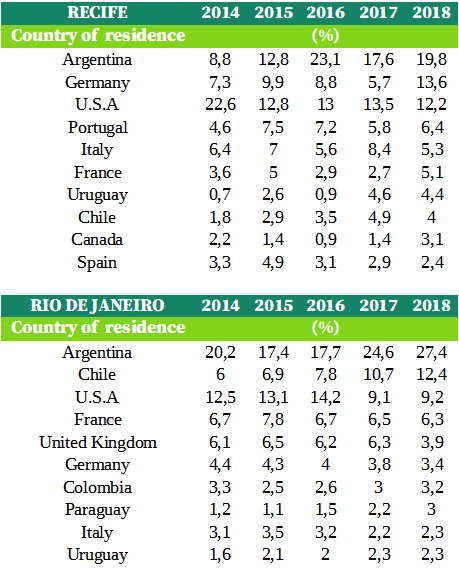

Argentinians are the most popular tourist in both cities, but in the other positions the result is varied. In spite of that, there is only a single Argentinian restaurant in the data. On the other hand Japanese tourists are not in the list, but the Japanese is the one most present in both cities. We can infer that maybe tourists, when they come abroad, want to taste different spices from those they have in their respective countries.
As we can see in the cluster maps, the largest number of restaurants is not near the coastal strip, but in the center of the cities. This is probably because in Brazil, the city´s center is where more people go to work, and thus there is more need to have restaurants nearby.
The correlation between the types of restaurants was, in a way, surprising. I can't glimpse a direct cause, I just imagine that maybe it's because the population has similar tastes, but I'm not sure about that. In the future I will take a larger sample of cities and analyze if this correlation is maintained.


# 6. Conclusion
By the end of this project, we saw that distant cities (more than 2.300 km), in the same country, have more similarities than imagined. The places where the restaurants are and the kind of restaurants are more likely to be comparable. Using the great Folium library we can see the data in a way that everybody can understand it. 
This project took a valuable time, totally necessary to better understand how to use the tools available to data scientists. 